<h1 align = 'center'>Computer Vision Final Project: Breast Cancer Tumor Classification</h1>
<h2 align = 'center'>Section 1 Spring 2023</h2>
<h3 align = 'center'> Nicholas Lee, Nic Brathwaite, Amir Moayed</h3>

<h4 align = 'center'><a href = "https://github.com/NickBrath/Computer-Vision-281-Final-Project">Github Repository</a></h4>

<p align = 'center'><a href="https://colab.research.google.com/github/NickBrath/Computer-Vision-281-Final-Project/blob/main/Nick_Lee_Baseline_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a></p>

# Introduction
Breast cancer is the most prevalent form of cancer, accounting for 2,261,419 (11.7%) of the 19,292,789 cases reported worldwide in 2020 according to the world health organization. Early diagnosis of cancer is crucial in ensuring the best chances of recovery. One main method is biopsing tissue for tumor detection using immunohistochemistry staining. Staining tissues is labor and time intensive, and training an expert to interpret the results takes even longer. Even experts have bias in their analysis so a lot of research has been geared towards using machine learning and computer vision to help detect cancer faster and at scale. The purpose of this project is to create a tool to help experts classify breast tumors as either benign or malignant (cancerous) subtypes from histopathological images.  

<u>Data</u>  
The Breast Cancer Histopathological Image Classification (BreakHis) is composed of 9,109 microscopic images of breast tumor tissue collected from 82 patients using different magnifying factors (40X, 100X, 200X, and 400X).  The dataset contains 2,480 benign and 5,429 malignant samples (700X460 pixels, 3-channel RGB, 8-bit depth in each channel, PNG format). In total there are two major classes of identification: benign and malignant. Furthermore, there are eight sub categories of classification, 4 in each of the main categories. 


<center><img src="..\imgs\tumor_classification_tree.png" alt="map of tumor classification" height = 400 width = 600/></center>

Possible features of benign tumors to look for in images: 
histologically benign [1]
	(adjective) Referring to a lesion that does not meet any criteria of malignancy – e.g., marked cellular atypia, mitosis, disruption of basement membranes, metastasize.



---

**Remove before submission**

Consuming TFRecord data
Refer to the Loading TFRecords tutorial for an end-to-end example.

The tf.data API supports a variety of file formats so that you can process large datasets that do not fit in memory. For example, the TFRecord file format is a simple record-oriented binary format that many TensorFlow applications use for training data. The tf.data.TFRecordDataset class enables you to stream over the contents of one or more TFRecord files as part of an input pipeline.

*look at transfer learning for other similar problems that might help our model https://www.tensorflow.org/guide/keras/transfer_learning*

##  To Do

Organize notebook into sections

---

# Setup

## Packages

In [2]:
# high resolution images
%config InlineBackend.figure_format ='retina'

In [2]:
%run ..\..\scripts\packages.py

In [4]:
# print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
# tf.config.list_physical_devices('GPU')

## Functions

### Loading data

In [5]:
# pickle object for later
import pickle

def pickler(ob, pklFileName):
    """ 
      Create pickle object to load later or in different environments for use later

      ob: object, python object intended to pickle
      pklFileName: string, name of the pickle file e.g. "User/content/drive/209/ThisDataFrame.pkl"
    """

    with open(pklFileName, "wb+") as f:
        pickle.dump(ob, f)


def load_pickles(pklFilePath):
    """
      path: string, path to object
      pklFileName: string, pickle file name with extension .pkl
    """

    return pd.read_pickle(pklFilePath)


In [6]:
def imshow(image, title=None):
  """ Show image from tensor"""
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)
    
def clip_0_1(image):
  """ Ensure values for image are between 0 and 1"""
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [7]:
def create_image_set(ds, num_images = 5): 
    """ Create preview of images with labels 
    Takes the num_images from the dataset for viewing in plots
    
    Args: 
    ds (tensorflow dataset): tensorflow dataset with images
    """
    
    images = []
    for i, t in enumerate(ds.take(num_images)): 
        images.append(
            {'label': tf.argmax(t[1].numpy()).numpy(), 
            'im' : t[0].numpy()}
        )

    return images

### Plotting Functions

In [8]:
# all the functions used for viewing images and model results
# %run ../python/plotting_functions.py

### Dataset creation for model functions

## File Paths

In [9]:
# Paths
main_path = "G:\\My Drive\\"

project_path = "w281_final_project"
project_path = os.path.join(main_path, project_path)

datadir = os.path.join(project_path, "Data")

save_path = "".join([date.today().strftime('%Y%m%d'), "_baseline_models/"])
save_path = "".join([project_path, save_path])

# Sanity Check
print("project path: ", project_path)
print("Data directory", datadir)
print("save path: ", save_path)


project path:  G:\My Drive\w281_final_project
Data directory G:\My Drive\w281_final_project\Data
save path:  G:\My Drive\w281_final_project20230417_baseline_models/


## Load tensorflow dataset to use in models

In [10]:
# load metadata information for full paths and annotations
df = load_pickles(os.path.join(datadir, "pickles\metaData.pkl"))

# starting with 40x
df.query('MAGNIFICATION == "40"').reset_index(inplace=True, drop=True)

# swap beginning path from google drive to local computer path
pattern = "/content/drive/MyDrive/"
replacement = "G:/My Drive/"

df['FULL_PATH'] = df['FULL_PATH'].str.replace(pattern, replacement)

df.info()
df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7909 entries, 0 to 7908
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   BIOPSY_PROCEDURE  7909 non-null   object
 1   TUMOR_CLASS       7909 non-null   object
 2   TUMOR_TYPE        7909 non-null   object
 3   YEAR              7909 non-null   object
 4   SLIDE_ID          7909 non-null   object
 5   MAGNIFICATION     7909 non-null   object
 6   SEQ               7909 non-null   object
 7   FULL_PATH         7909 non-null   object
 8   BASE_NAME         7909 non-null   object
dtypes: object(9)
memory usage: 556.2+ KB


,BIOPSY_PROCEDURE,TUMOR_CLASS,TUMOR_TYPE,YEAR,SLIDE_ID,MAGNIFICATION,SEQ,FULL_PATH,BASE_NAME
0,SOB,B,A,14,22549AB,100,004,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-004.png
1,SOB,B,A,14,22549AB,100,002,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-002.png
2,SOB,B,A,14,22549AB,100,003,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-003.png
3,SOB,B,A,14,22549AB,100,001,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-001.png
4,SOB,B,A,14,22549AB,100,007,G:/My Drive/w281_final_project/Data/BreaKHis_v...,SOB_B_A-14-22549AB-100-007.png


# EDA

In [11]:
# changing for ordering tables
df['MAGNIFICATION'] = df['MAGNIFICATION'].astype('int32')

# table of classes
df_grouped = df.groupby(by=['MAGNIFICATION','TUMOR_CLASS'])[['TUMOR_TYPE']].value_counts()

In [12]:
pd.pivot_table(data = df[['MAGNIFICATION', 'TUMOR_CLASS']],
               index = ['MAGNIFICATION'],
               columns=['TUMOR_CLASS'],
            #    values = ['YEAR'],
               aggfunc=np.count_nonzero,
               margins=True, 
               margins_name='Total Count')

TUMOR_CLASS,B,M,Total Count
MAGNIFICATION,,,
40,1250,2740,1995
100,1288,2874,2081
200,1246,2780,2013
400,1176,2464,1820
Total Count,2480,5429,7908


In [13]:
pd.pivot_table(data = df[['MAGNIFICATION', 'TUMOR_CLASS','TUMOR_TYPE']],
               index = ['MAGNIFICATION'],
               columns=['TUMOR_CLASS','TUMOR_TYPE'],
            #    values = ['YEAR'],
               aggfunc=np.count_nonzero,
               margins=True, 
               margins_name='Total Count')

TUMOR_CLASS      B                      M                   Total Count
TUMOR_TYPE       A     F   PT    TA    DC    LC    MC    PC            
MAGNIFICATION                                                          
40             342   759  327   447  2592   468   615   435        1995
100            339   780  363   450  2709   510   666   426        2081
200            333   792  324   420  2688   489   588   405        2013
400            318   711  345   390  2364   411   507   414        1820
Total Count    888  2028  906  1138  6902  1252  1584  1120        7908

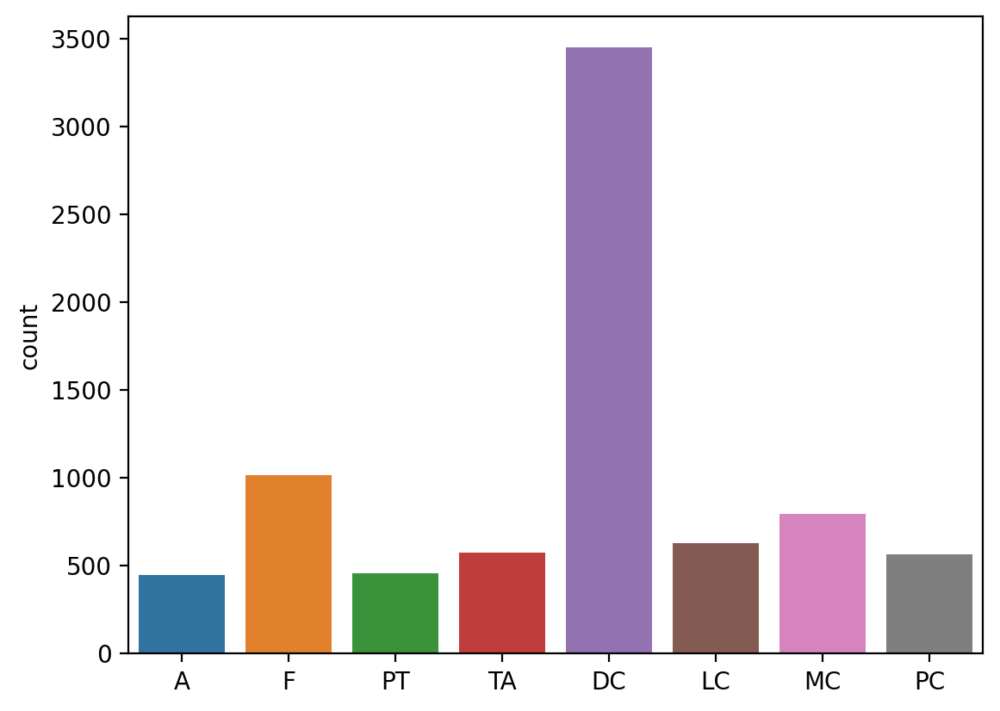

In [14]:
# check distribution of labels
sns.countplot(x=df['TUMOR_TYPE'].values);

DC is by far the most prevelant in the dataset

### Examples of images

Text(0.5, 0.98, 'Sample of images in dataset')

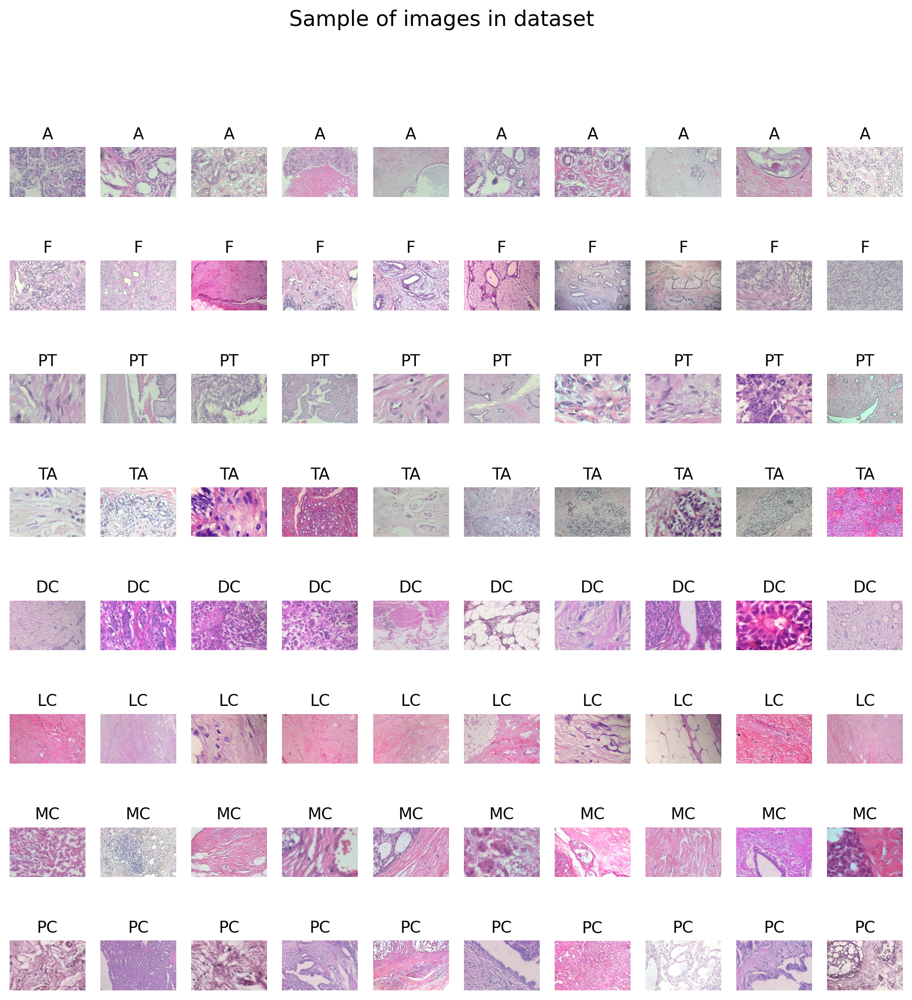

In [15]:
# Examples of images
df_temp = pd.concat([
    df.query('TUMOR_TYPE == "A"').sample(10).reset_index(drop=True), 
    df.query('TUMOR_TYPE == "F"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "PT"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "TA"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "DC"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "LC"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "MC"').sample(10).reset_index(drop=True),
    df.query('TUMOR_TYPE == "PC"').sample(10).reset_index(drop=True),
]).reset_index(drop = True)

nrows = 8
ncols = 10

fig, axs = plt.subplots(nrows, ncols, figsize=(12,12))

# Flatten axes to make it easier to access
axs = axs.flatten()

for i, file in enumerate(df_temp['FULL_PATH']):
    #read in file
    pic = plt.imread(file)

    # add image to axes
    axs[i].imshow(pic)

    # drop axis labels
    axs[i].axis('off')
    # add axes title
    axs[i].set(title=df_temp.loc[i, 'TUMOR_TYPE'])

fig.suptitle("Sample of images in dataset", fontsize=16)


Typically a trained histologist would evalulate the staining of each slide and rank them from 1-5 based on their own criteria. This provides issues when compariing tissues sections from different patients and labs. Processing the tissues and staining with hematoxylin and eosin can cause different artifcats to be present in the slides. Additional variations can come from image capture procedures. Luckily in this dataset the data curators used the same equipment and settings (*fact check please*). Regardless, it may be beneficial to normalize for brightness or intensity of colors. Initially our approach will be to use only grey scale images. 

There are also gaps in some of the tissue that cause the area size to vary between slides. 
Orientation could also be a challenge. The tissue is not always oriented the same way to the view of the tissue can change depending on how the parafin was sectioned and laid on a slide. 

There are substructures within the images that histologist normally use to annotate these images. These features are important because the types of tissues that the cancer is affecting will change the appearance of the slide and staining profile. Understanding the effected cellular structures also helps to lead to diagnosises in the clinic. It would be interesting in future work to use this set to see what structures are effected by different types of cancer. 

In [16]:
# Variation in contrast across types
from PIL import Image, ImageStat

image_stats = pd.DataFrame()

def load_im_get_stats(file, path): 
    results = pd.DataFrame()
    
    im = Image.open(path)
    stats = ImageStat.Stat(im)
    
    # get stats for image
    for band,channel in enumerate(im.getbands()): 
        # print(f'Band: {name}, min/max: {stats.extrema[band]}, stddesv: {stats.stddev[band]}')
        temp = {
            'BASE_NAME':file,
            'channel': channel,
            'Min' : [stats.extrema[band][0]],
            'Max' : [stats.extrema[band][1]],
            'stddev' : [stats.stddev[band]]
        }

        results = pd.concat([results, pd.DataFrame.from_dict(temp)])
        
        del temp
    
    return results
    

might be able to capture variation in channels this way

In [17]:
file, path = df.loc[0, ['BASE_NAME', 'FULL_PATH']]
test = load_im_get_stats(file, path)
pd.DataFrame.from_dict(test)

,BASE_NAME,channel,Min,Max,stddev
0,SOB_B_A-14-22549AB-100-004.png,R,89,234,25.675540
0,SOB_B_A-14-22549AB-100-004.png,G,86,243,40.017458
0,SOB_B_A-14-22549AB-100-004.png,B,96,246,22.027746


---

# Feature Engineering (35 pts)
- Label encoding
- Feature engineering

- [ ] plots showing the amount of variation in the dataset, as well as PCA decomposition and tSNE visualization of features.
- [ ] Details to why features are chosen

Features to create from main paper
- local binary patterns (17) (LBP)
- completed LBP
- local phase quantization (LPQ)
- gray-level co-occurance matric (CLCM)
- threshold adjacency statistics (TAS)

More about [batched datasets](https://www.tensorflow.org/guide/data#batching_dataset_elements)

## Label Encoding and Decoding

In [18]:
def create_tf_ds(file_paths, labels):
    """ Create tensorflow dataset from file paths and labels """
    # create dataset
    ds = tf.data.Dataset.from_tensor_slices(
        (file_paths, labels))  # mapping like a zip in python

    return ds

def read_image(image_file_path, label):
    """Function to read in images to create tf dataset"""
    
    image = tf.io.read_file(image_file_path)  # read in image
    
    # preserving RGB colors with channels = 3. Reads array
    image = tf.image.decode_image(image, channels=3, dtype=tf.float32)

    return image, label


In [19]:
# convert labels to numeric representation
from sklearn.preprocessing import LabelEncoder

# create encoder
labelencoder = LabelEncoder()

file_paths = df['FULL_PATH'].values
# using subtype of tumor labels as labels to get 8 different labels. Could use 'TUMOR_CLASS' if you want binary classification problem.

labels = df['TUMOR_TYPE'].values

## One-hot encoding for labels
# number of categories
depth = len(set(labels))

# apply encoder to change string labels to integer
labels_encoded = labelencoder.fit_transform(labels)

# One-hot encodning to feed into model(s)
labels = tf.one_hot(labels_encoded, depth=depth)

# create dataset (ds)
ds = create_tf_ds(file_paths, labels)

### Decode Labels

*work in progress*

In [20]:
def decode_labels(labels_encoded): 
    # get labels back out
    return labelencoder.inverse_transform(labels_encoded)

## Example
# get numpy array of values and decode
# tf_labels_encoded = tf.argmax(labels, axis=1).numpy()
# decode_labels(tf_labels_encoded)

In [21]:
def one_hot_argmax(label): 
    """ Getting the max value will help to decode since we have a 1 x 8 array size"""
    return tf.argmax(label, axis=0).numpy()

# test_label = one_hot_argmax(test_label)
# test_label = np.array(test_label)

## Image Augmentation

Rubric: 
At least 2 simple feature types
1. [ ] HOG
2. [ ] local binary pattern

- [] Image Sharpening
- [] Contrast
- [] GrayScale

One complex feature: 
1. [ ] Parameter Free Threshold Adjacency Statistics (PFTAS)

- [x] Edge Detection : applied sobel edge detection
- [] Feature Tracking

tf functions for images: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image

https://www.tensorflow.org/api_docs/python/tf/image/extract_patches

### Basic Augmentations

In [22]:
def augment_crop(image, label, size = 128): 
    """ Crops image by defining a bounding box
    
    Using to make sure the images are the same size.     
    """
    # normalize image size to a square and get smaller subsection
    offsetwidth = offsetheight = size
    image = tf.image.crop_to_bounding_box(image, 0, 0, offsetwidth, offsetheight)
    
    return image, label

In [23]:
def augment_centralcrop(image, label): 
    """take image and return fraction of the image cropped centered"""
    # needs work
    image = tf.image.central_crop(image, 0.5)
    
    return image, label

In [24]:
def augment_patches(image, label): 
    """ Get patches of image like a convolution"""
    #### Random sample 32, 32, 3 like they do in the paper
    
    image = tf.image.extract_patches(
        images=image,
        sizes=[1, 32, 32, 1],
        strides=[1, 16, 16, 1],
        rates=[1, 1, 1, 1],
        padding='VALID'
        )
    
    return image, label

In [25]:
def augment_grayscale(image, label):
    # turn image from RGB to grayscale
    if tf.random.uniform((), minval=0, maxval=1) < 0.1:
        image = tf.tile(tf.image(tf.image.rgb_to_grayscale(image), [1, 1, 3]))
    
    return image, label

In [26]:
def augment_sharpen(image, label): 
    
    # image sharpening
    
    return image, label

In [27]:
def augment_contrast(image, label): 
    """ Adjust contrast of image """
    
    image = tf.image.random_contrast(image, lower=0.1, upper=0.5)
    
    return image, label

In [28]:
def augment_normalize(image, label):
    """ Normalize images for pixel intensity variations to gaussian distribution"""
    
    return tf.cast(image, tf.float32) / 255.0, label

In [29]:
def augment_brightness(image, label): 
    """ Change image brightness on pixels a random amount """
    image = tf.image.random_brightness(image, max_delta=0.1)
    
    return image, label

In [30]:
def augment_flip(image,label):
    """ horizontal and vertically flip images"""
    image = tf.image.random_flip_left_right(image)  # 50%
    image = tf.image.random_flip_up_down(image)
    
    return image, label

In [31]:
def augment_rotation(image, label): 
    """ Apply a random rotation """
    
    image = tf.keras.preprocessing.image.random_rotation(image)
    
    return image, label

### Advanced Augmentations

Sobel Edges

In [32]:
def read_image_sobel(image_file_path, label):
    """Function to read in images to create tf dataset. Adds an extra dimension for batch. Allows use on sobel filter. """
    
    image = tf.io.read_file(image_file_path)  # read in image
    
    # preserving RGB colors with channels = 3. Reads array
    image = tf.image.decode_image(image, channels=3, dtype=tf.float32)
    
    # add batch dimension
    image = image[tf.newaxis, :]

    return image, label

In [33]:
def augment_sobel_edges(image, label): 
    """ Apply the sobel-edge dector function over tensors"""
    image = tf.image.sobel_edges(image)
    
    return image, label

In [34]:
def plot_sobel_images(images, nrows, ncols = 2): 
    """ List of image dictionaries with label: value, im: array
    Plots the sobel filter applied to an image side by side for the vertical and horizontal edges. 
    
    """

    fig, axs = plt.subplots(nrows, ncols, figsize=(5, 10))
    
    def squeeze_3d(image, title=None):
        """ Show image from tensor"""
        if len(image.shape) > 3:
            image = tf.squeeze(image, axis=0)
        return image

    for i, im in enumerate(images):
        # set label for the graph
        label = str(im['label'])
        
        # extract image array
        im = im['im']
        
        # two, one for the horizontal and vertical sobel edges
        for j in range(2): 
            # add image to axes            
            axs[i,j].imshow(squeeze_3d(im[..., j]/4+0.5))
            
            # drop axis labels
            axs[i,j].axis('off')
            
            # add axes title
            if j ==  0: 
                title = 'Horizontal'
            else: 
                title = 'Vertical'
                
            axs[i,j].set(title="-".join([label,title]))
        
    fig.suptitle("Sample of Sobel-edges", fontsize=16)

    plt.show()

In [35]:
def decode_labels(labels_encoded): 
    # get labels back out
    return labelencoder.inverse_transform(labels_encoded)

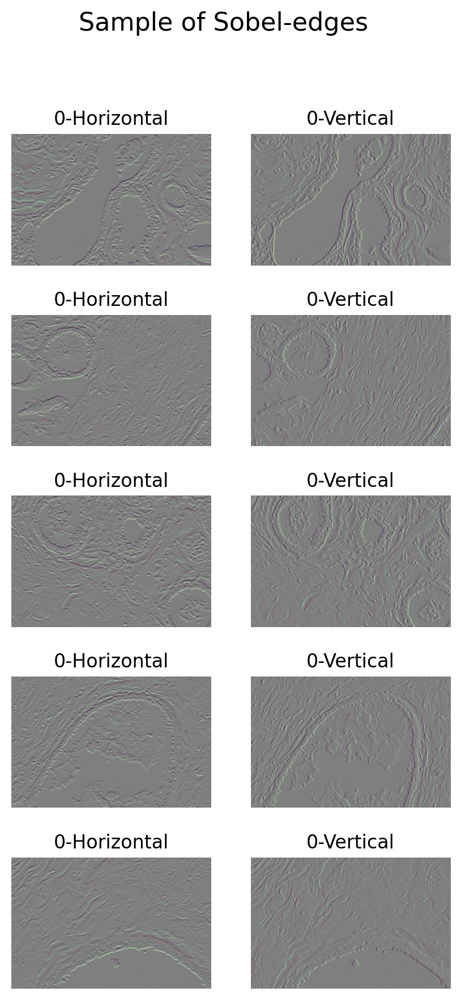

In [36]:
ds_temp = ds.map(read_image_sobel).map(augment_sobel_edges)
images_sobel = create_image_set(ds_temp, 5)
plot_sobel_images(images_sobel, 5)

Full augmentation steps

In [37]:
def augment(image, label):
    # data augmentation here
    # is done while the model is training
    # did it this way to change which augmentations are applied. Thought it would be easier to break down functions into parts. 

    # image, label = augment_normalize(image,label)
    
    image, label = augment_crop(image,label)
    
    image, label = augment_grayscale(image,label)
    
    image, label = augment_sharpen(image,label)
    
    image, label = augment_brightness(image,label)
    
    image, label = augment_contrast(image,label)
    
    image, label = augment_flip(image,label)
   
    return image, label

## Applying Different Augmentations

### Functions for viewing images

In [38]:
def plot_images(images, nrows, ncols, gray_scale = False): 
    """ List of image dictionaries with label: value, im: array"""

    if gray_scale == True: 
        plt.set_cmap("gray")
    
    fig, axs = plt.subplots(nrows, ncols, figsize=(8, 3))    
    fig.text(.5, .0001, "Sample of images from dataset", ha='center')

    if nrows == 1 or ncols == 1:
        plots = max(nrows, ncols)
        for i in range(plots):
            label = str(images[i]['label'])
            
            im = images[i]['im']

            # add image to axes
            axs[i].imshow(im)
            # drop axis labels
            axs[i].axis('off')
            # add axes title
            axs[i].set(title=label)
            
    else: 
        # create iterator to continuously index the images
        im_index = 0
        for r in range(nrows):
            for c in range(ncols):
                # label for subplot title
                label = str(images[im_index]['label'])
                
                # image array
                im = images[im_index]['im']

                # add image to axes
                axs[r,c].imshow(im)
                
                # drop axis labels
                axs[r,c].axis('off')
                
                # add axes title
                axs[r,c].set(title=label)
                
                # next index
                im_index += 1
                
    plt.tight_layout()
    plt.show();

In [39]:
def plot_images_with_histogram(images, nrows): 
    """ List of image dictionaries with label: value, im: array
    plots image with histogram side by side
    """
    
    fig, axs = plt.subplots(nrows, ncols = 2, figsize=(15, 3))

    # Flatten axes to make it easier to access
    # axs = axs.flatten()

    for i, im in enumerate(images):
        #read in file
        # pic = plt.imread(file)
        label = str(im['label'])
        
        im = im['im']
        # add image to axes
        axs[i, 0].imshow(im)
        # drop axis labels
        axs[i, 0].axis('off')
        # add axes title
        axs[i, 0].set(title=label)
        
        # add histogram 
        axs[i, 1].hist((im*255).ravel(), bins = 100, fc='k', ec='k')
        
    plt.tight_layout()
    plt.show()

### Testing augmentations
Map different augment functions to the dataset as below

#### Base images unaltered

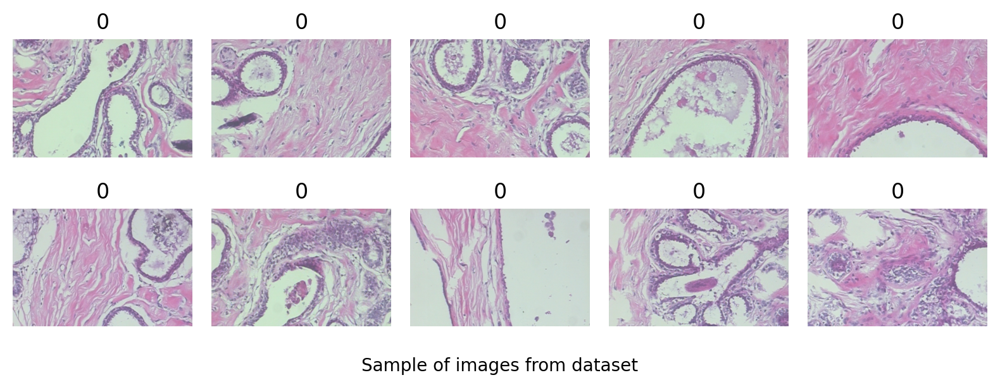

In [40]:
num_sample = 10

ds_temp = ds.map(read_image)
images_base = create_image_set(ds_temp, num_sample)

nrows = 2

plot_images(images_base, nrows, int(num_sample/nrows))

#### Cropping to upper left hand corner

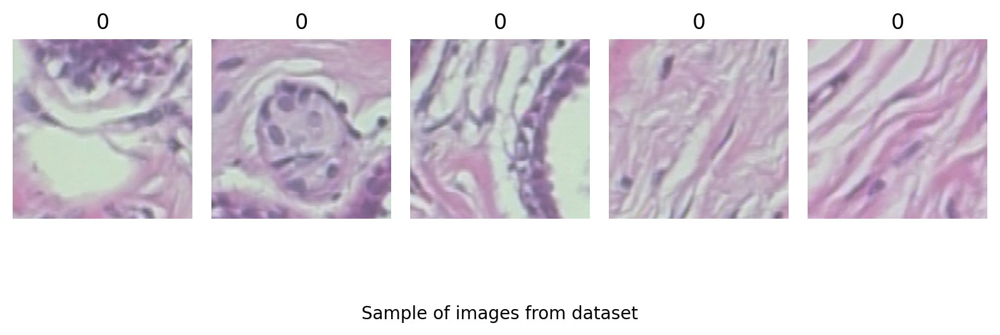

In [41]:
num_images = 5

ds_temp = ds.map(read_image).map(augment_crop)
image_resize = create_image_set(ds_temp, num_images)

plot_images(image_resize, 1, num_images)

#### Contrast

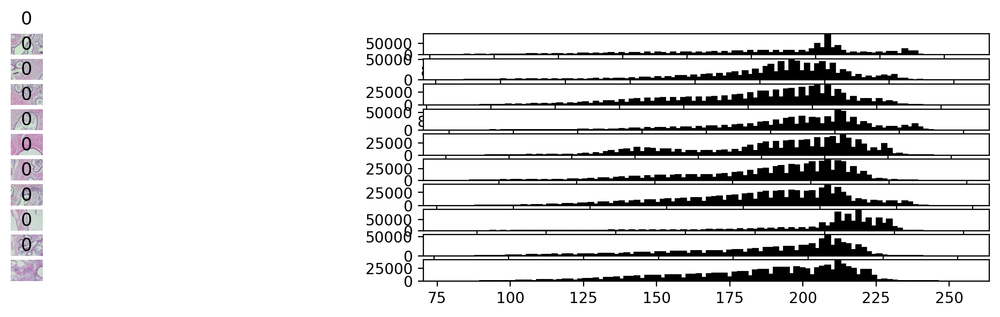

In [42]:
plot_images_with_histogram(images_base, nrows = len(images_base))

Various amounts of contrast are seen in this sample set. This can be due to the tissue structure, image artifacts such as shearing, and empty white space skewing the histogram profile. 

Applying grayscale to images

In [43]:
def augment_grayscale(image, label):
    # turn image from RGB to grayscale
    image = tf.image.rgb_to_grayscale(image)
    
    # if tf.random.uniform((), minval=0, maxval=1) < 0.1:
    #     image = tf.tile(tf.image(tf.image.rgb_to_grayscale(image), [1, 1, 3]))
    
    return image, label


In [44]:

ds_gray = ds.map(read_image)
ds_gray = ds_gray.map(augment_grayscale)
images_gray = create_image_set(ds_gray, 10)

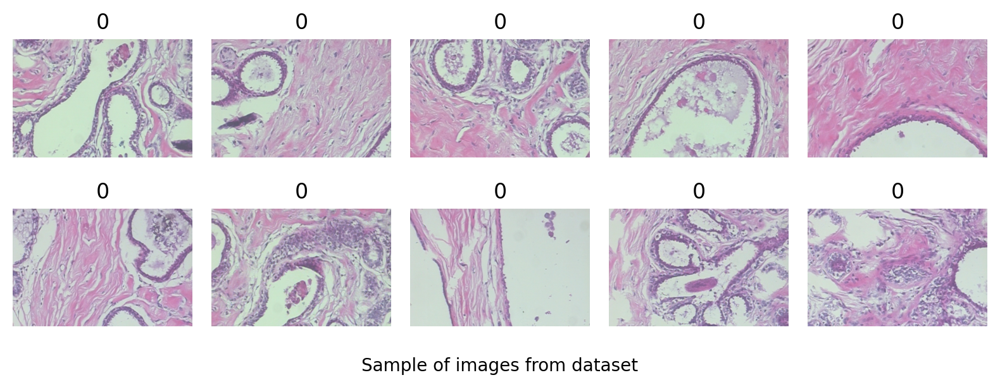

In [45]:
plot_images(images_base, 2, 5)

<Figure size 640x480 with 0 Axes>

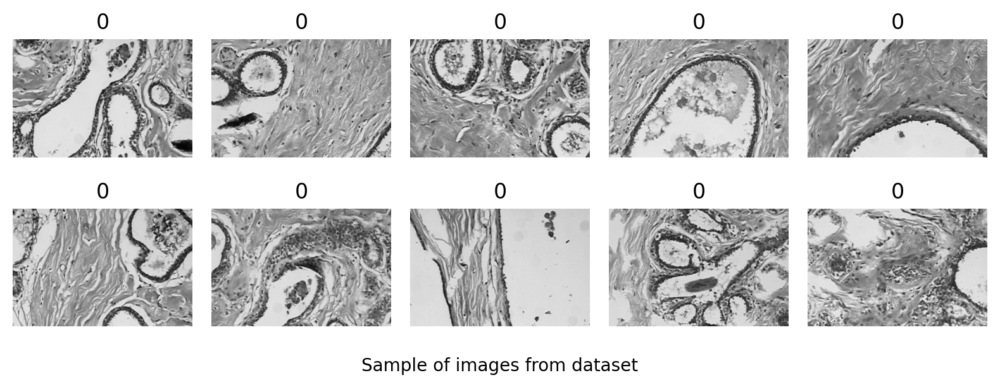

In [46]:
plot_images(images_gray, 2, 5, gray_scale=True)

Looking at the gray scale helps to eliminate some of the bias see in the original images. 

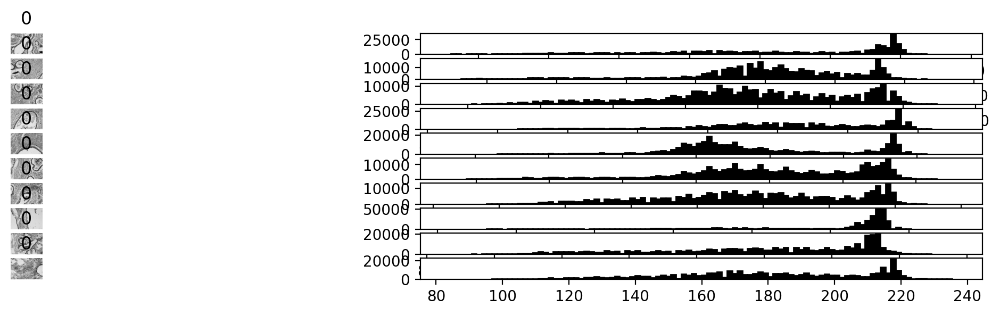

In [47]:
plot_images_with_histogram(images_gray, nrows = len(images_gray))

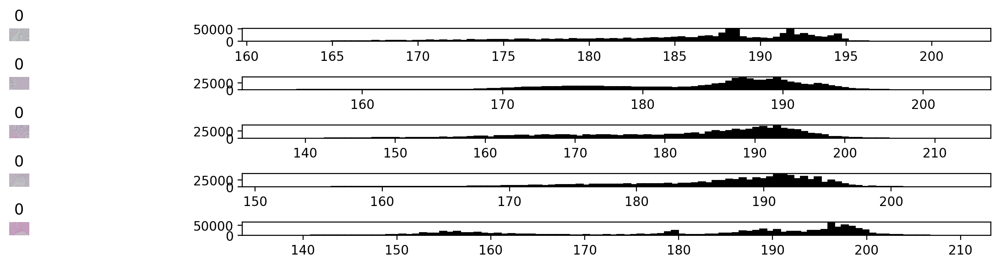

In [48]:
# Contrast
ds_temp = ds.map(read_image).map(augment_contrast)
images_contrast = create_image_set(ds_temp, 5)

## create general view of images
# plot_images(images_contrast, nrows = len(images_contrast))
plot_images_with_histogram(images_contrast, nrows = len(images_contrast))

We can have an unequal distribution of pixels due to the sectioning of the tissue

Can we normalize the contrast and pixel intensities found in the images? 

### Edges Investigation

In [49]:
# grad_components = tf.image.sobel_edges(img)

In [50]:
def augment_process(image, label):
    # data augmentation here
    # is done while the model is training
    # did it this way to change which augmentations are applied. Thought it would be easier to break down functions into parts. 

    image, label = augment_normalize(image,label)
    
    image, label = augment_crop(image,label)
    
    # image, label = augment_grayscale(image,label)
    
    # image, label = augment_sharpen(image,label)
    
    # image, label = augment_brightness(image,label)
    
    # image, label = augment_contrast(image,label)
    
    # image, label = augment_flip(image,label)
   
    return image, label

## Class Imbalance Problem
Stratified splits to deal with issue. 

In [51]:
# create weights


In [52]:
# set mean to zero and std to 1
# scaler = StandardScaler()
# train_ds = scaler.fit_transform(train_ds)

## Train, test split

In [53]:
# Initial train and test split.
# train_df, test_df = train_test_split(
#     arxiv_data_filtered,
#     test_size=test_split,
#     stratify=arxiv_data_filtered["terms"].values,
# )
# convert after preprocessing
# tf.convert_to_tensor(x_train, dtype=tf.float32)

More info on splitting data in [tensorflow](https://www.tensorflow.org/datasets/splits)

In [54]:
def configure_for_performance(ds, batch_size = 32):
  ds = ds.cache()
  ds = ds.shuffle(buffer_size=1000)
  ds = ds.batch(batch_size)
  ds = ds.prefetch(buffer_size=AUTOTUNE)
  return ds

In [55]:
DATASET_SIZE = ds.cardinality().numpy()

train_size = int(0.7 * DATASET_SIZE)
val_size = int(0.10 * DATASET_SIZE)
test_size = int(0.20 * DATASET_SIZE)

ds = ds.shuffle(buffer_size= DATASET_SIZE)
train_ds = ds.take(train_size)
test_ds = ds.skip(train_size)
val_ds = test_ds.skip(val_size)
test_ds = test_ds.take(test_size)

print(tf.data.experimental.cardinality(train_ds).numpy())
print(tf.data.experimental.cardinality(val_ds).numpy())
print(tf.data.experimental.cardinality(test_ds).numpy())

5536
1583
1581


Optimize datasets for training model

In [56]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Set `num_parallel_calls` so multiple images are loaded/processed in parallel.
train_ds = train_ds.map(read_image, num_parallel_calls=AUTOTUNE).map(augment_process, num_parallel_calls=AUTOTUNE)
test_ds = test_ds.map(read_image,  num_parallel_calls=AUTOTUNE).map(augment_process, num_parallel_calls=AUTOTUNE)
val_ds = val_ds.map(read_image,  num_parallel_calls=AUTOTUNE).map(augment_process, num_parallel_calls=AUTOTUNE)

In [57]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(128, 128, 3)
(8,)


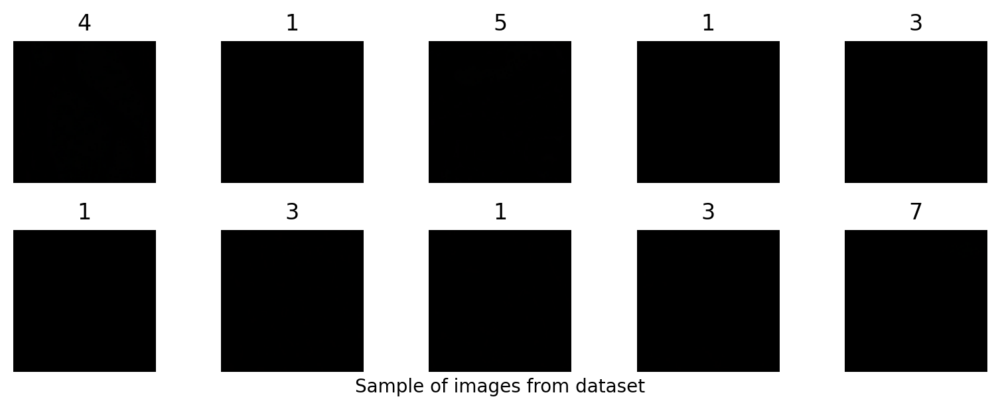

In [58]:
train_sample = create_image_set(train_ds, 10)
plot_images(train_sample, nrows=2, ncols =5)

Configuring for performance

To train a model with this dataset you will want the data:
- To be well shuffled.
- To be batched.
- Batches to be available as soon as possible.

https://www.tensorflow.org/tutorials/load_data/images#standardize_the_data

In [59]:
train_ds = configure_for_performance(train_ds)
val_ds = configure_for_performance(val_ds)

## Image Segemenation

## Discussion on chosen features

---

# Classification (35 pts)

Create at least two classifiers: 
1. SVM
2. simple perception



## Functions for models

In [60]:
def plot_hist(hist): 
    """ View into model history. 
    hist = model.fit() results
    
    """
    
    # get history
    hist_dict = hist.history
    hist_df = pd.DataFrame.from_dict(hist_dict)

    # Use index to get Epochs
    hist_df.reset_index(inplace = True)
    hist_df.rename({'index': 'Epoch'}, axis = 1, inplace = True)
    # hist_df = pd.melt(hist_df, id_vars = 'index')

    # Create Subsets
    accuracy = hist_df.loc[:, ['Epoch','accuracy', 'val_accuracy']]
    loss = hist_df.loc[:, ['Epoch', 'loss', 'val_loss']]

    # Flatten dfs
    accuracy = pd.melt(accuracy, id_vars = 'Epoch')
    loss = pd.melt(loss, id_vars = 'Epoch')

    # flatten df to plot
    # hist_melt = pd.melt(hist_df, id_vars = 'index').rename({'index': 'Epoch'}, axis = 1)

    # call regplot on each axes
    fig, (ax1, ax2) = plt.subplots(ncols=2, sharey=False)

    sns.lineplot(data = accuracy, ax = ax1, x = 'Epoch', y = 'value', hue = 'variable').set_title('Accuracy')
    sns.lineplot(data = loss, ax = ax2, x = 'Epoch', y = 'value', hue = 'variable').set_title('Loss')
        

In [61]:
def create_checkpoint(path): 
    # Create a checkpoint directory to store the checkpoints.
    checkpoint_dir = './training_checkpoints'
    checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
    
    return checkpoint_prefix

In [62]:
def compile_fit_model(model): 
    """_summary_

    Args:
        model (_type_): _description_

    Returns:
        _type_: _description_
    """
    
    model.compile(
        optimizer='adam',
        loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
        metrics=['accuracy',
            tf.keras.metrics.Precision(), 
            tf.keras.metrics.TruePositives(thresholds=0),
            tf.keras.metrics.TrueNegatives(thresholds=0),
            tf.keras.metrics.FalseNegatives(thresholds=0),
            tf.keras.metrics.FalsePositives(thresholds=0)])

    hist = model.fit(
        train_ds,
        verbose = 1,
        validation_data=val_ds,
        epochs=3
    )
    
    return model, hist

## Base Model

In [63]:
num_classes = 8

model = tf.keras.Sequential([
  tf.keras.layers.Input((128, 128, 3)),
  tf.keras.layers.Conv2D(64, 3, activation='relu'), # same as kernel size of (3,3)
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes)
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 64)       0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 254016)            0         
                                                                 
 dense (Dense)               (None, 128)               32514176  
                                                                 
 dense_1 (Dense)             (None, 8)                 1032      
                                                                 
Total params: 32,517,000
Trainable params: 32,517,000
Non-trainable params: 0
____________________________________________

In [64]:
model.compile(
  optimizer='adam',
  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
  metrics=['accuracy',
    tf.keras.metrics.Precision(), 
    tf.keras.metrics.TruePositives(thresholds=0),
    tf.keras.metrics.TrueNegatives(thresholds=0),
    tf.keras.metrics.FalseNegatives(thresholds=0),
    tf.keras.metrics.FalsePositives(thresholds=0)])

hist = model.fit(
  train_ds,
  verbose = 1,
  validation_data=val_ds,
  epochs=3
)

# plot model training results
plot_hist(hist)

Epoch 1/3
173/173 [==============================] - 58s 308ms/step - loss: 1.7718 - accuracy: 0.4366 - precision: 0.3810 - true_positives: 3698.0000 - true_negatives: 24945.0000 - false_negatives: 1838.0000 - false_positives: 13807.0000 - val_loss: 1.7248 - val_accuracy: 0.4447 - val_precision: 0.4447 - val_true_positives: 1199.0000 - val_true_negatives: 5948.0000 - val_false_negatives: 384.0000 - val_false_positives: 5133.0000
Epoch 2/3
 98/173 [===============>..............] - ETA: 16s - loss: 1.7348 - accuracy: 0.4407 - precision: 0.4288 - true_positives: 2177.0000 - true_negatives: 13658.0000 - false_negatives: 959.0000 - false_positives: 8294.0000

Confusion Matrix

In [ ]:
pd.DataFrame(hist.history)

,loss,accuracy,precision,true_positives,true_negatives,false_negatives,false_positives,val_loss,val_accuracy,val_precision,val_true_positives,val_true_negatives,val_false_negatives,val_false_positives
0,1.787735,0.432442,0.376788,3623.0,25522.0,1913.0,13230.0,1.773344,0.437145,0.437145,1045.0,7377.0,538.0,3704.0
1,1.750876,0.434610,0.434187,3596.0,26408.0,1940.0,12344.0,1.716729,0.437145,0.437145,1045.0,7377.0,538.0,3704.0
2,1.727225,0.434610,0.437022,3633.0,26078.0,1903.0,12674.0,1.703474,0.437145,0.437145,907.0,8810.0,676.0,2271.0


size of cancer cells and progress of patients
brightness contrast, window detection iding siz of window. same window to different resolution
- feature tracking with TF 
  - integrating into models, post model or pre-processing

- gray scale
- UMAP
- sharpening and contrast

In [ ]:
# # Baseline TensorFlow model
# def create_baseline_cnn(train_ds,val_ds):
#     # max_sequence_length, hidden_layers, filters, kernel_size, learning_rate, embedding_size - other parameters excluding for now
    
#     """ 
#     Creating baseline CNN for comparison
#     """
    
#     num_classes = 8

#     model = tf.keras.Sequential([
#     tf.keras.layers.Input((120, 120, 3)),
#     layers.Conv2D(16, 3, activation='relu'), # same as kernel size of (3,3)
#     tf.keras.layers.MaxPooling2D(),
#     tf.keras.layers.Flatten(),
#     tf.keras.layers.Dense(128, activation='relu'),
#     tf.keras.layers.Dense(num_classes)
#     ])

#     model.summary()

#     model.compile(
#     optimizer='adam',
#     loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
#     metrics=['accuracy',
#         tf.keras.metrics.Precision(), 
#         tf.keras.metrics.TruePositives(thresholds=0),
#         tf.keras.metrics.TrueNegatives(thresholds=0),
#         tf.keras.metrics.FalseNegatives(thresholds=0),
#         tf.keras.metrics.FalsePositives(thresholds=0)])

#     hist = model.fit(
#     train_ds,
#     verbose = 1,
#     validation_data=val_ds,
#     epochs=3
#     )
    
#     return hist


In [ ]:
# baseModel = create_baseline_cnn(train_ds,val_ds)

## Paper Model: CNN
Input Layer: 
- some transformations such as mean-subtraction and feature scaling
- parameters are (32 x 32 or 64 x 64) and 3 channels for RGB

Convolution Layers:
- (kernels) are of size 5 × 5, the zero-padding is set to 2 and the stride is set to 1. 
- first two convolutional layers learn 32 filters, initialized from Gaussian Distribution with SD of 0.0001 and 0.01 respectively
- last layer learns 64 filters and intialized from Gaussian distribution with SD of 0.0001

Pooling Layers: 
- responsible for down sampling spatial dimension of input
- one after each convolution layer
- 3 x 3 receptive field with stride of 2 
- first uses max operation over receptive field and other two are average pooling

ReLU Layers: 
- Treating as a layer
- Given an input value x, the ReLU layer computes the neuron’s output f(x) as x if x > 0 and (α × x) if x <= 0. The parameter α specifies whether to leak the negative part by multiplying it with the slope value (0.01 or so) rather than setting it to 0.
- default α is 0. When not set, $f(x) = max(0,x)$ aka activation threshold at zero

Inner-product layers (fully connected layers): 
- input treated as vector and produce output in form of single vector
- two inner-product layers
- the last is a fully-connected output layer with softmax activation and depends on number of classes for classification problem 2 for binary classification


In [ ]:
# num_classes = 8

# model = tf.keras.Sequential([
#     tf.keras.layers.Input((120, 120, 3)),
#     tf.keras.layers.Conv2D(filters=32, kernel_size=(5,5), strides = (1,1), activation='relu'),
#     tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
#     tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
#     tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
#     tf.keras.layers.Flatten(),
#     tf.keras.layers.Dense(128, activation='relu'),
#     tf.keras.layers.Dense(units=num_classes, activation='softmax')
# ])

# model.summary()

# model.compile(
#     optimizer='adam',
#     loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
#     metrics=['accuracy',
#         tf.keras.metrics.Precision(), 
#         tf.keras.metrics.TruePositives(thresholds=0),
#         tf.keras.metrics.TrueNegatives(thresholds=0),
#         tf.keras.metrics.FalseNegatives(thresholds=0),
#         tf.keras.metrics.FalsePositives(thresholds=0)]
# )

# hist = model.fit(
#     train_ds,
#     verbose = 0,
#     validation_data=val_ds,
#     epochs=3
# )

# plot_hist(hist)

The main idea is to extract from the high resolution
images patches with sizes that are close to those of the CIFAR
dataset. Since we are dealing with textures, the main premise is
that these patches can contain enough information for training
a model, provided an appropriate set of patches is extracted
from each image. 

Two Strategies: 
1. 32 x 32 window with 50% overlap
2. 64 x 64 window with no overlap and random sampling on image

In [ ]:
# learningRate = 1E-6
# momentumTerm = 0.9
# weightDecay = 4e-5
# iterations = 8e5

## Classifier 3: Random Forest
https://www.tensorflow.org/decision_forests/api_docs/python/tfdf/keras/RandomForestModel

Amir's code

In [ ]:
# #Setting the learning rate to reduce gradually over the training period
# lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
#   0.001,
#   decay_steps=20*50,
#   decay_rate=1,
#   staircase=False)

# def get_optimizer():
#   return tensorflow.keras.optimizers.Adam(lr_schedule)

In [ ]:
# #Compiling the model
# cancer_model.compile(loss='binary_crossentropy', optimizer = get_optimizer(), metrics = ['accuracy'])
# early_stop = EarlyStopping(monitor='val_loss',patience=5)
# checkpoint = ModelCheckpoint("./Best_model/",save_best_only=True,)

In [ ]:
# #Model is fitted using train and validation generator for 200 epochs
# history = cancer_model.fit(train_generation, validation_data=val_generation, epochs=200 ,
#                  callbacks=[early_stop,checkpoint], verbose = 1)

In [ ]:
# import tensorflow_decision_forests as tfdf

ModuleNotFoundError: No module named 'tensorflow_decision_forests'

In [ ]:
# Encode the categorical labels as integers.
#
# Details:
# This stage is necessary if your classification label is represented as a
# string since Keras expects integer classification labels.
# When using `pd_dataframe_to_tf_dataset` (see below), this step can be skipped.

# Name of the label column.
# label = "TUMOR_CLASS"

# classes = df[label].unique().tolist()
# print(f"Label classes: {classes}")

# df[label] = df[label].map(classes.index)

In [ ]:
# Split the dataset into a training and a testing dataset.

# def split_dataset(dataset, test_ratio=0.30):
#   """Splits a panda dataframe in two."""
#   test_indices = np.random.rand(len(dataset)) < test_ratio
#   return dataset[~test_indices], dataset[test_indices]


# train_ds_pd, test_ds_pd = split_dataset(df)
# print("{} examples in training, {} examples for testing.".format(
#     len(train_ds_pd), len(test_ds_pd)))

In [ ]:
# train_ds = tfdf.keras.pd_dataframe_to_tf_dataset(train_ds_pd, label=label)
# test_ds = tfdf.keras.pd_dataframe_to_tf_dataset(test_ds_pd, label=label)

In [ ]:
# %set_cell_height 300

# # Specify the model.
# model_1 = tfdf.keras.RandomForestModel(verbose=2)

# # Train the model.
# model_1.fit(train_ds)

---

In [ ]:
def model_checkpoint_constructor(checkpoint_name): 
    # Define the callback to save the model weights
    checkpoint_path = os.path.join(r"..\models\checkpoints", checkpoint_name)
    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_path,
        save_weights_only=True,
        monitor="accuracy",
        save_best_only=True,
        verbose=1
    )
    
    return checkpoint_callback

In [ ]:
checkpoint_callback = model_checkpoint_constructor("model_checkpoint.h5")

In [ ]:
# # Define the callback to save the model weights
# checkpoint_path = r"..\models\checkpoints\model_checkpoint.h5"
# checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
#     filepath=checkpoint_path,
#     save_weights_only=True,
#     monitor="accuracy",
#     save_best_only=True,
#     verbose=1
# )

# # Train the model with the callback
# hist = model.fit(
#     train_ds,
#     epochs=10,
#     batch_size=32,
#     validation_data=val_ds,
#     callbacks=[checkpoint_callback]
# )

# plot_hist(hist)


### Evaluate Model 

In [ ]:
# model.predict(test_ds)

### Load Model

In [ ]:
# Load the best model weights from the checkpoint
# model.load_weights(checkpoint_path)

## Amir's Sigmoid Model for binary classification

Here the Image Data Generator is defined with following functions:
1. Random rotation by 20 degrees.
2. Horizontal flip.
3. Vertical flip.
4. Rescale image by its pixel value.
5. Randomly Zoom image by 20%.
6. Random shear by 20%.

CNN Architecture:
1. CNN architecture is defined using Conv2D layers and Maxpooling layers.
2. Dropout Layers are added to randomly turn off some neurons while training to prevent from overfitting.
3. Flatten layer is added at the end to form Dense Layers.
4. relu is used as activation in all the layers and Sigmoid as the activation in the output layer.

In [ ]:
# convert labels to numeric representation
from sklearn.preprocessing import LabelEncoder

# create encoder
labelencoder = LabelEncoder()

file_paths = df['FULL_PATH'].values
# using subtype of tumor labels as labels to get 8 different labels. Could use 'TUMOR_CLASS' if you want binary classification problem.

labels = df['TUMOR_CLASS'].values

## One-hot encoding for labels
# number of categories
depth = len(set(labels))

# apply encoder to change string labels to integer
labels_encoded = labelencoder.fit_transform(labels)

# One-hot encodning to feed into model(s)
labels = tf.one_hot(labels_encoded, depth=2)

# create dataset (ds)
ds = create_tf_ds(file_paths, labels)

In [ ]:
labels_binary = df['TUMOR_CLASS'].values
labels_binary = df['TUMOR_CLASS'].replace({'B':0, 'M':1}).values
# create dataset (ds)
ds = create_tf_ds(file_paths, labels_binary)

In [ ]:
DATASET_SIZE = ds.cardinality().numpy()

train_size = int(0.7 * DATASET_SIZE)
val_size = int(0.10 * DATASET_SIZE)
test_size = int(0.20 * DATASET_SIZE)

ds = ds.shuffle(buffer_size= DATASET_SIZE)
train_ds = ds.take(train_size)
test_ds = ds.skip(train_size)
val_ds = test_ds.skip(val_size)
test_ds = test_ds.take(test_size)

print(tf.data.experimental.cardinality(train_ds).numpy())
print(tf.data.experimental.cardinality(val_ds).numpy())
print(tf.data.experimental.cardinality(test_ds).numpy())

5536
1583
1581


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Set `num_parallel_calls` so multiple images are loaded/processed in parallel.
train_ds = train_ds.map(read_image_sobel, num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)
test_ds = test_ds.map(read_image_sobel,  num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)
val_ds = val_ds.map(read_image_sobel,  num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)

In [ ]:
#Defining the base model
cancer_model = Sequential()

#First Layer
cancer_model.add(tf.keras.layers.Input(shape = (128, 128, 3)))
cancer_model.add(Conv2D(filters = 32, kernel_size = (3,3), activation = 'relu'))
cancer_model.add(MaxPooling2D(pool_size = (2,2)))

#Second Layer
cancer_model.add(Conv2D(filters = 64, kernel_size = (3,3), padding = 'same',activation = 'relu'))
cancer_model.add(MaxPooling2D(pool_size = (2,2)))

#Third Layer
cancer_model.add(Conv2D(filters = 128, kernel_size = (3,3), padding = 'same', activation = 'relu'))
cancer_model.add(MaxPooling2D(pool_size = (2,2)))
cancer_model.add(Dropout(0.4))

#Fourth Layer
cancer_model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = 'same', activation = 'relu'))
cancer_model.add(MaxPooling2D(pool_size = (2,2)))
cancer_model.add(Dropout(0.2))

#Flattening the layers
cancer_model.add(Flatten())

#Adding the dense layer
cancer_model.add(Dense(256, activation = 'relu'))
cancer_model.add(Dense(128, activation = 'relu'))
cancer_model.add(Dense(1))

cancer_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 63, 63, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 31, 31, 64)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 31, 31, 128)       73856     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 15, 15, 128)     

In [ ]:
#Setting the learning rate to reduce gradually over the training period
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.001,
  decay_steps=20*50,
  decay_rate=1,
  staircase=False)

def get_optimizer():
  return tf.keras.optimizers.Adam(lr_schedule)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, Callback , ModelCheckpoint

#Compiling the model
cancer_model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=False), optimizer = get_optimizer(), metrics = ['accuracy'])
early_stop = EarlyStopping(monitor='val_loss',patience=5)
checkpoint = ModelCheckpoint("../models/best_model/",save_best_only=True,)

In [ ]:
#Model is fitted using train and validation generator for 200 epochs
history = cancer_model.fit(train_ds,
                           validation_data=val_ds,
                           epochs=200,
                           callbacks=[early_stop,checkpoint],
                           verbose = 1)

Epoch 1/200


ValueError: in user code:

    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\training.py", line 1146, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\training.py", line 1135, in run_step  **
        outputs = model.train_step(data)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\training.py", line 994, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\training.py", line 1052, in compute_loss
        return self.compiled_loss(
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\compile_utils.py", line 279, in __call__
        batch_dim = tf.shape(y_t)[0]

    ValueError: slice index 0 of dimension 0 out of bounds. for '{{node strided_slice}} = StridedSlice[Index=DT_INT32, T=DT_INT32, begin_mask=0, ellipsis_mask=0, end_mask=0, new_axis_mask=0, shrink_axis_mask=1](Shape, strided_slice/stack, strided_slice/stack_1, strided_slice/stack_2)' with input shapes: [0], [1], [1], [1] and with computed input tensors: input[1] = <0>, input[2] = <1>, input[3] = <1>.


In [ ]:
#Plotting the model results

#Getting the accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

#Getting the losses
loss = history.history['loss']
val_loss = history.history['val_loss']

#No of epochs it trained
epochs_range = history.epoch

#Plotting Training and Validation accuracy
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

#Plotting Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
#Loading the test data using Image Data Generator
test_gen = datagen.flow_from_directory("tensorflow/Cancer_test/", target_size=(128,128), class_mode="binary", batch_size=1, shuffle=False)

In [ ]:
pred = cancer_model.evaluate(test_gen)

In [ ]:
#Let's Go ahead and test our model for few Images.

#Array to hold Input Images and their labels
test = []
labels = []

#Loading random 10 images
random_images = np.random.choice(data_test.index,10)

#For loop to read and store images
for i in random_images:
    #Finding their class to load from folder
    label = data_test.loc[i,"class"]
    labels.append(label)
    if label == 1:
        lab = "malignant"
    else:
        lab = "benign"
    #Creating path
    path = os.path.join("../Cancer_test/", lab, i)
    #reading image
    img = cv2.imread(path)
    #resizing to target shape
    img = cv2.resize(img,(128,128))
    #Making it an numpy array
    img = np.array(img)
    #Appending it to the list
    test.append(img)

#Making the list as numpy array
test = np.asarray(test)
#rescaling it by pixel value
test = test/255.

In [ ]:
#Performing the prediction
pred = (cancer_model.predict(test) > 0.5).astype("int32")
#Flattening the list to form single dimensional list
pred = pred.flatten()

In [ ]:
#Plotting results and actual prediction
plt.figure(figsize=(20,10))
plt.suptitle("Prediction Vs Actual Result")
for i in range(0,10):
    string = "Actual:" + str(labels[i]) + ", Predicted:" + str(pred[i])
    plt.subplot(2,5,i+1)
    plt.imshow(test[i])
    plt.title(string)

## Nic's Models

## Image Augmentation

In [ ]:
from skimage.feature import hog
from scipy import signal
from scipy.ndimage import convolve

In [ ]:
### Histogram Equalization Contrast
def histogram_equalization(im):
  img_cdf, bins = exposure.cumulative_distribution(im, 256)
  container = np.zeros(256)
  container[bins] = img_cdf
  holding_image = np.empty(im.shape)
  for i in range(im.shape[0]):
    for y in range(im.shape[1]):
      holding_image[i][y] = container[im[i][y]]
  equalized_image = holding_image
  equalized_image = img_as_ubyte(equalized_image) 
  return equalized_image

In [ ]:
""" create a 2-D gaussian blurr filter for a given mean and std """
def create_2d_gaussian(size=9, std=1.5):
    gaussian_1d = signal.gaussian(size,std=std)
    gaussian_2d = np.outer(gaussian_1d, gaussian_1d)
    gaussian_2d = gaussian_2d/(gaussian_2d.sum())
    return gaussian_2d

In [ ]:
def sharpen_image(image):
  # Blur filter from previous work
  h = np.array([[0.0751, 0.1238, 0.0751], 
              [0.1238, 0.2042, 0.1238],
              [0.0751, 0.1238, 0.0751]])
  blurred_image = convolve(image, h)
  high_frequency_image = np.subtract(image, blurred_image)
  sharpened_image = np.add(image, high_frequency_image)
  return sharpened_image

In [ ]:
def edge_detection(image):
  # Construct a HOG for each image and edge detection

  filter = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
  gradients = sc.ndimage.convolve(image, filter)

  histograms = hog(image, orientations = 7, pixels_per_cell=(16,16))

  return gradients, histograms

### Baseline CNN

In [ ]:
### Baseline TensorFlow model
def create_baseline_cnn(input_shape = (460,700,1), hidden_layers = 0, filters = 4, kernel_size = 3, learning_rate = 0.001, embedding_size = 0):
  
  input_layer = tf.keras.layers.Input(input_shape, batch_size=3, name="Input_Layer")
  convolve_layer = tf.keras.layers.Conv2D(filters=5, kernel_size=3, activation='relu')(input_layer)
  drop_layer = tf.keras.layers.Dropout(0.03)(convolve_layer)
  convolve_layer_2 = tf.keras.layers.Conv2D(filters= filters, kernel_size=3, activation='relu')(drop_layer)
  flatten = tf.keras.layers.Flatten()(convolve_layer_2)
  compress = tf.keras.layers.Dense(1, activation='sigmoid')(flatten)
  base_model = tf.keras.Model(inputs=[input_layer], outputs=[compress])
  base_model.compile(optimizer='sgd', loss="binary_crossentropy", metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

  return base_model

### Average CNN

In [ ]:
### Baseline Average CNN Model
def create_average_cnn(input_shape = (460, 700, 1), hidden_layers = 3, filters = 3, kernel_size = 3, learning_rate = 0.001, dropout_rate = 0.1):

  input_layer = tf.keras.layers.Input(shape=input_shape, batch_size = 3, name="Starting_Layer")

  # for i in range(hidden_layers):
  convolve1 = tf.keras.layers.Conv2D(filters=128, kernel_size=kernel_size, activation="ReLU", name = "Average_layer")(input_layer)
  avg_layer = tf.keras.layers.AveragePooling2D()(convolve1)
  convolve2 = tf.keras.layers.Conv2D(filters=64, kernel_size=kernel_size, activation="ReLU")(avg_layer)
  avg_layer = tf.keras.layers.AveragePooling2D()(convolve2)
  convolve3 = tf.keras.layers.Conv2D(filters=32, kernel_size=kernel_size, padding='valid', activation='relu')(avg_layer)
  avg_layer = tf.keras.layers.AveragePooling2D()(convolve3)
  avg_layer = tf.keras.layers.Dropout(dropout_rate)(avg_layer)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()(avg_layer)
  # flatten_layer = tf.keras.layers.Flatten()(global_average_layer)
  avg_layer = tf.keras.layers.Dropout(dropout_rate)(global_average_layer)
  compress_layer = tf.keras.layers.Dense(8, activation = "ReLU")(avg_layer)
  classification_layer = tf.keras.layers.Dense(1, activation = "sigmoid")(compress_layer)
  model = tf.keras.Model(inputs=[input_layer], outputs=[classification_layer])

  model.compile(optimizer = tf.keras.optimizers.SGD(learning_rate = learning_rate),
                                 loss = "binary_crossentropy",
                                 metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])
  return model

### Max CNN Model

In [ ]:
def create_max_cnn_model(input_shape = (460,700, 1), hidden_layers=3, filters=5, kernel_size=3, learning_rate=0.001, dropout_rate=0.1):

  input_layer = tf.keras.layers.Input(input_shape, batch_size=32, name="Starting_Layer", dtype=tf.float64)
  convolve_1 = tf.keras.layers.Conv2D(filters=128, kernel_size=3, padding='valid', activation='relu')(input_layer)
  max_1 = tf.keras.layers.MaxPool2D()(convolve_1)
  convolve_2 = tf.keras.layers.Conv2D(filters=64, kernel_size=3, padding='valid', activation='relu')(max_1)
  max_2 = tf.keras.layers.MaxPool2D()(convolve_2)
  convolve_3 = tf.keras.layers.Conv2D(filters=32, kernel_size=3, padding='valid', activation='relu')(max_2)
  max_3 = tf.keras.layers.MaxPool2D()(convolve_3)
  slight_adjustment = tf.keras.layers.Dropout(dropout_rate)(max_3)

  flatten = tf.keras.layers.GlobalMaxPooling2D()(slight_adjustment)
  compress = tf.keras.layers.Dense(1, activation='sigmoid')(flatten)
  model = tf.keras.Model(inputs=[input_layer], outputs=[compress])

  model.compile(optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate),
                loss = "binary_crossentropy",
                metrics = ['Accuracy', tf.keras.metrics.Precision()])
  
  return model

### ResNet Model

In [ ]:
# tf.keras.applications.resnet50.ResNet50(
#     include_top=True,
#     weights='imagenet',
#     input_tensor=None,
#     input_shape=None,
#     pooling=None,
#     classes=1000,
#     **kwargs
# )

In [ ]:
# tf.keras.applications.resnet50.preprocess_input(
#     x, data_format=None
# )

# i = tf.keras.layers.Input([None, None, 3], dtype = tf.uint8)
# x = tf.cast(i, tf.float32)
# x = tf.keras.applications.resnet50.preprocess_input(x)
# core = ttf.keras.applications.resnet50.ResNet50()
# x = core(x)
# model = tf.keras.Model(inputs=[i], outputs=[x])

# image = tf.image.decode_png(tf.io.read_file('file.png'))
# result = model(image)

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import backend

In [ ]:
def create_resnet_model(input_shape = (460,700,3),data_format='channels_last',  kernel_size=3, learning_rate=0.001, dropout_rate=0.1):

  input_layer = layers.Input(input_shape, name="Initial_input", dtype=tf.float64)
  conv1_pad = tf.keras.layers.ZeroPadding2D(padding=1)(input_layer)
  
  conv1_conv = tf.keras.layers.Conv2D(filters=128, strides = 1, kernel_size=kernel_size, padding="same", activation='relu',groups=1)(conv1_pad)
  conv1_bn = tf.keras.layers.BatchNormalization(axis=1)(conv1_conv) # , synchronized=True
  
  conv1_relu = tf.keras.activations.relu(

  added_layer = tf.keras.layers.Add()([input_layer, norm_1])

  weights_2 = tf.keras.layers.Conv2D(filters=64, strides = 1, kernel_size=kernel_size, padding="same", activation='relu' )(added_layer)
  norm_2 = tf.keras.layers.BatchNormalization(axis=1)(weights_2)

  added_layer_2 = tf.keras.layers.Add()([input_layer, norm_2])

  weights_3 = tf.keras.layers.Conv2D(filters=32, strides = 1,kernel_size=kernel_size, padding="same", activation='relu')(added_layer_2)
  norm_3 = tf.keras.layers.BatchNormalization(axis=1)(weights_3)

  added_layer_3 = tf.keras.layers.Add()([input_layer, norm_3])
  drop_layer = tf.keras.layers.Dropout(dropout_rate)(added_layer_3)

  flatten = tf.keras.layers.Flatten()(drop_layer)
  # flatten = tf.keras.layers.MaxPool2D()(drop_layer)
  # drop_layer = tf.keras.layers.Dropout(dropout_rate)(flatten)
  
  compress = tf.keras.layers.Dense(1, activation="sigmoid")(flatten)
  model = tf.keras.Model(inputs = [input_layer], outputs=[compress])

  model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate),
                loss = "binary_crossentropy",
                metrics = ["Accuray", tf.keras.metrics.Precision()])
  
  return model

In [ ]:
def block1(x, filters, kernel_size=3, stride=1, conv_shortcut=True, name=None):
    """A residual block.
    Args:
      x: input tensor.
      filters: integer, filters of the bottleneck layer.
      kernel_size: default 3, kernel size of the bottleneck layer.
      stride: default 1, stride of the first layer.
      conv_shortcut: default True, use convolution shortcut if True,
          otherwise identity shortcut.
      name: string, block label.
    Returns:
      Output tensor for the residual block.
    """
    bn_axis = 3 if backend.image_data_format() == "channels_last" else 1

    if conv_shortcut:
        shortcut = layers.Conv2D(
            4 * filters, 1, strides=stride, name=name + "_0_conv"
        )(x)
        shortcut = layers.BatchNormalization(
            axis=bn_axis, epsilon=1.001e-5, name=name + "_0_bn"
        )(shortcut)
    else:
        shortcut = x

    x = layers.Conv2D(filters, 1, strides=stride, name=name + "_1_conv")(x)
    x = layers.BatchNormalization(
        axis=bn_axis, epsilon=1.001e-5, name=name + "_1_bn"
    )(x)
    x = layers.Activation("relu", name=name + "_1_relu")(x)

    x = layers.Conv2D(
        filters, kernel_size, padding="SAME", name=name + "_2_conv"
    )(x)
    x = layers.BatchNormalization(
        axis=bn_axis, epsilon=1.001e-5, name=name + "_2_bn"
    )(x)
    x = layers.Activation("relu", name=name + "_2_relu")(x)

    x = layers.Conv2D(4 * filters, 1, name=name + "_3_conv")(x)
    x = layers.BatchNormalization(
        axis=bn_axis, epsilon=1.001e-5, name=name + "_3_bn"
    )(x)

    x = layers.Add(name=name + "_add")([shortcut, x])
    x = layers.Activation("relu", name=name + "_out")(x)
    return x

In [ ]:
def stack1(x, filters, blocks, stride1=2, name=None):
    """A set of stacked residual blocks.
    Args:
      x: input tensor.
      filters: integer, filters of the bottleneck layer in a block.
      blocks: integer, blocks in the stacked blocks.
      stride1: default 2, stride of the first layer in the first block.
      name: string, stack label.
    Returns:
      Output tensor for the stacked blocks.
    """
    x = block1(x, filters, stride=stride1, name=name + "_block1")
    for i in range(2, blocks + 1):
        x = block1(
            x, filters, conv_shortcut=False, name=name + "_block" + str(i)
        )
    return x

In [ ]:
def stack_fn(x):
        x = stack1(x, 64, 3, stride1=1, name="conv2")
        x = stack1(x, 128, 4, name="conv3")
        x = stack1(x, 256, 6, name="conv4")
        return stack1(x, 512, 3, name="conv5")

In [ ]:
stack1(train_ds, 64, 3, stride1=1, name="conv2")

TypeError: Inputs to a layer should be tensors. Got: <ParallelMapDataset element_spec=(TensorSpec(shape=<unknown>, dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [ ]:
stack_fn(train_ds)

TypeError: Inputs to a layer should be tensors. Got: <ParallelMapDataset element_spec=(TensorSpec(shape=<unknown>, dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [ ]:
# tf.keras.applications.ResNet50()

In [ ]:
# tf.keras.applications.ResNet50().summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [ ]:
def resnet_preprocessing(image, label): 
    
    image = tf.keras.applications.resnet.preprocess_input(image)
    
    return image, label

In [ ]:
resnet_model = create_resnet_model()

ValueError: Inputs have incompatible shapes. Received shapes (460, 700, 3) and (460, 700, 128)

In [ ]:
resnet_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Initial_input (InputLayer)     [(32, 460, 700, 1)]  0           []                               
                                                                                                  
 conv2d_13 (Conv2D)             (32, 460, 700, 128)  1280        ['Initial_input[0][0]']          
                                                                                                  
 batch_normalization_7 (BatchNo  (32, 460, 700, 128)  1840       ['conv2d_13[0][0]']              
 rmalization)                                                                                     
                                                                                                  
 add_7 (Add)                    (32, 460, 700, 128)  0           ['Initial_input[0][0]',    

In [ ]:
def read_image(image_file_path, label):
    """Function to read in images to create tf dataset. Adds an extra dimension for batch. Allows use on sobel filter. """
    
    image = tf.io.read_file(image_file_path)  # read in image
    
    # preserving RGB colors with channels = 3. Reads array
    image = tf.image.decode_image(image, channels=3, dtype=tf.float64)

    return image, label

In [ ]:
def resnet_preprocessing(image, label): 
    
    image = tf.keras.applications.resnet.preprocess_input(image)
    
    return image, label

In [ ]:
DATASET_SIZE = ds.cardinality().numpy()

train_size = int(0.7 * DATASET_SIZE)
val_size = int(0.10 * DATASET_SIZE)
test_size = int(0.20 * DATASET_SIZE)

ds = ds.shuffle(buffer_size= DATASET_SIZE)
train_ds = ds.take(train_size)
test_ds = ds.skip(train_size)
val_ds = test_ds.skip(val_size)
test_ds = test_ds.take(test_size)

print(tf.data.experimental.cardinality(train_ds).numpy())
print(tf.data.experimental.cardinality(val_ds).numpy())
print(tf.data.experimental.cardinality(test_ds).numpy())

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# Set `num_parallel_calls` so multiple images are loaded/processed in parallel.
train_ds = train_ds.map(read_image, num_parallel_calls=AUTOTUNE).batch(32) # .map(resnet_preprocessing, num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)
test_ds = test_ds.map(read_image,  num_parallel_calls=AUTOTUNE).batch(32) # .map(resnet_preprocessing, num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)
val_ds = val_ds.map(read_image,  num_parallel_calls=AUTOTUNE).batch(32) # .map(resnet_preprocessing, num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)

NameError: name 'ds' is not defined

In [ ]:
# DATASET_SIZE = ds.cardinality().numpy()

# train_size = int(0.7 * DATASET_SIZE)
# val_size = int(0.10 * DATASET_SIZE)
# test_size = int(0.20 * DATASET_SIZE)

# ds = ds.shuffle(buffer_size= DATASET_SIZE)
# train_ds = ds.take(train_size)
# test_ds = ds.skip(train_size)
# val_ds = test_ds.skip(val_size)
# test_ds = test_ds.take(test_size)

# print(tf.data.experimental.cardinality(train_ds).numpy())
# print(tf.data.experimental.cardinality(val_ds).numpy())
# print(tf.data.experimental.cardinality(test_ds).numpy())

# AUTOTUNE = tf.data.AUTOTUNE
# train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
# val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

# # Set `num_parallel_calls` so multiple images are loaded/processed in parallel.
# train_ds = train_ds.map(read_image, num_parallel_calls=AUTOTUNE).map(augment_grayscale,num_parallel_calls=AUTOTUNE) # .map(resnet_preprocessing, num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)
# test_ds = test_ds.map(read_image,  num_parallel_calls=AUTOTUNE).map(augment_grayscale,num_parallel_calls=AUTOTUNE) # .map(resnet_preprocessing, num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)
# val_ds = val_ds.map(read_image,  num_parallel_calls=AUTOTUNE).map(augment_grayscale,num_parallel_calls=AUTOTUNE) # .map(resnet_preprocessing, num_parallel_calls=AUTOTUNE) # .map(augment_process, num_parallel_calls=AUTOTUNE)

NameError: name 'ds' is not defined

In [ ]:
#Setting the learning rate to reduce gradually over the training period
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
  0.001,
  decay_steps=20*50,
  decay_rate=1,
  staircase=False)

def get_optimizer():
  return tf.keras.optimizers.Adam(lr_schedule)

from tensorflow.keras.callbacks import EarlyStopping, Callback , ModelCheckpoint

#Compiling the model
resnet_model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=False), optimizer = get_optimizer(), metrics = ['accuracy'])
early_stop = EarlyStopping(monitor='val_loss',patience=5)
checkpoint = ModelCheckpoint("../models/resnet_best_model/",save_best_only=True,)

history = resnet_model.fit(train_ds,
                           validation_data=val_ds,
                           epochs=20,
                           callbacks=[early_stop,checkpoint],
                           verbose = 1)

Epoch 1/20
  1/173 [..............................] - ETA: 2:43:09 - loss: 0.7534 - accuracy: 0.6875

InvalidArgumentError: Graph execution error:

Detected at node 'IteratorGetNext' defined at (most recent call last):
    File "c:\Users\nickl\anaconda3\envs\w281\lib\runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "c:\Users\nickl\anaconda3\envs\w281\lib\runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
      app.start()
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\ipykernel\kernelapp.py", line 712, in start
      self.io_loop.start()
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\tornado\platform\asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "c:\Users\nickl\anaconda3\envs\w281\lib\asyncio\base_events.py", line 603, in run_forever
      self._run_once()
    File "c:\Users\nickl\anaconda3\envs\w281\lib\asyncio\base_events.py", line 1909, in _run_once
      handle._run()
    File "c:\Users\nickl\anaconda3\envs\w281\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue
      await self.process_one()
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one
      await dispatch(*args)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell
      await result
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\ipykernel\kernelbase.py", line 730, in execute_request
      reply_content = await reply_content
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\ipykernel\ipkernel.py", line 383, in do_execute
      res = shell.run_cell(
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\ipykernel\zmqshell.py", line 528, in run_cell
      return super().run_cell(*args, **kwargs)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\IPython\core\interactiveshell.py", line 3006, in run_cell
      result = self._run_cell(
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\IPython\core\interactiveshell.py", line 3061, in _run_cell
      result = runner(coro)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\IPython\core\interactiveshell.py", line 3266, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\IPython\core\interactiveshell.py", line 3445, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\IPython\core\interactiveshell.py", line 3505, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\nickl\AppData\Local\Temp\ipykernel_9196\2150311920.py", line 18, in <module>
      history = resnet_model.fit(train_ds,
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\training.py", line 1564, in fit
      tmp_logs = self.train_function(iterator)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\training.py", line 1160, in train_function
      return step_function(self, iterator)
    File "c:\Users\nickl\anaconda3\envs\w281\lib\site-packages\keras\engine\training.py", line 1145, in step_function
      data = next(iterator)
Node: 'IteratorGetNext'
Cannot add tensor to the batch: number of elements does not match. Shapes are: [tensor]: [456,700,1], [batch]: [460,700,1]
	 [[{{node IteratorGetNext}}]] [Op:__inference_train_function_40438]

---

## Model Performance


$\text{Patient Score} = \frac{N_{rec}}{N_p}$  

## Global Patient Recognition Rate
$\text{Patient Recognition Rate} = \frac{\Sigma Patient Score}{Total Number of Patients}$

$\text{Image Recognition Rate} = \frac{N_{rec}}{N_{all}}$ 




## Export Model

In [ ]:
# from datetime import datetime
# t = datetime.now().strftime("%Y%m%d_%H%M%S")
# export_path = "./models/soft-f1_{}".format(t)
# tf.keras.experimental.export_saved_model(model, export_path)
# print("Model with macro soft-f1 was exported in this path: '{}'".format(export_path))

In [ ]:
# reloaded = tf.keras.experimental.load_from_saved_model(export_path,
#                                                        custom_objects={'KerasLayer':hub.KerasLayer})


# Generalizability (10 pts)

# Discussion (5 pts)

# References

1. Spanhol, F., Oliveira, L. S., Petitjean, C., Heutte, L., A Dataset for Breast Cancer Histopathological Image Classification, IEEE Transactions on Biomedical Engineering (TBME), 63(7):1455-1462, 2016. [pdf]
2. Spanhol, F., Oliveira, L. S., Petitjean, C., and Heutte, L., Breast Cancer Histopathological Image Classification using Convolutional Neural Network, International Joint Conference on Neural Networks (IJCNN 2016), Vancouver, Canada, 2016.
3. Data: https://www.kaggle.com/datasets/ambarish/breakhis/code
4. Dataset background and collection information: https://web.inf.ufpr.br/vri/databases/breast-cancer-histopathological-database-breakhis/